# Project: Predicting the status of "COVID-19" patients using Random Forests.




## Contents 

 
**1. Introduction: Coronavirus** 

**2. Objective** 

**3. Dataset** 

**4. Sourcing and loading** 
- Import packages
- Load The Data
- Explore the data
 
**5. Cleaning, Transforming, and Visualizing**
- Check the intgerity of the data and let's try fix as much as possible if any.
- Handle Numerical Missing Data.
- Create a new column named 'n_age' which is the calculated age based on the birth year column.
- Drop Insignificant columns.
- Visualization
- Check for duplicated rows.
- Handle Categorical Missing Data Using **KNN imputer "fancyimpute"** to encode and impute the missing Data.
- Check for duplicated rows.




  
**6. Random Forest Model** 
- Split the data into test and train subsamples
- Scale data to prep for model creation
- Fit Random Forest Classifier
- Classification Report
- ROC AUC
- Create Confusion Matrix Plots

**7. Plot feature importances** 

**8. Hyperparameter Tuning using GridSearchCV** 
- Visualize one Decision Tree from our base Model
- compare Random Forests (Base vs Tuned)
- Visualize same Decision Tree from our Tuned Model

**9. Conclusion** 



## 1. Introduction: Coronavirus
Coronavirus disease (COVID-19) is an infectious disease caused by a new virus.
The disease causes respiratory illness (like the flu) with symptoms such as a cough, fever, and in more severe cases, difficulty breathing. You can protect yourself by washing your hands frequently, avoiding touching your face, and avoiding close contact (1 meter or 3 feet) with people who are unwell. An outbreak of COVID-19 started in December 2019 and at the time of the creation of this project was continuing to spread throughout the world. Many governments recommended only essential outings to public places and closed most business that do not serve food or sell essential items. An excellent [spatial dashboard](https://www.arcgis.com/apps/opsdashboard/index.html#/bda7594740fd40299423467b48e9ecf6) built by Johns Hopkins shows the daily confirmed cases by country. 
![covidimage2](https://user-images.githubusercontent.com/67468718/106261986-2ca7f600-61d7-11eb-84e1-29362d5a425e.png)





## 2. Objective

In this Project we'll be highlighting the important role that data science plays in real-world situations like this pandemic. So we'll be building **a Random Forest Classifier** to predict the 'state' of the patient.

## 3. Dataset
Using a dataset from the South Korean cases of COVID-19 provided on [Kaggle](https://www.kaggle.com/kimjihoo/coronavirusdataset) to encourage research on this important topic.

## 4. Sourcing and Loading

First, let's load the required packages and modules into Python. Next, load the data into a pandas dataframe for ease of use.

### 4.1 Import Packages

In [2]:
import os
import pandas as pd
from datetime import datetime,timedelta
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline
import plotly.graph_objects as go
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.ensemble import ExtraTreesRegressor
import zipfile
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import export_graphviz
from subprocess import call


In C:\Users\aktha\anaconda3\lib\site-packages\matplotlib\mpl-data\stylelib\_classic_test.mplstyle: 
The text.latex.preview rcparam was deprecated in Matplotlib 3.3 and will be removed two minor releases later.
In C:\Users\aktha\anaconda3\lib\site-packages\matplotlib\mpl-data\stylelib\_classic_test.mplstyle: 
The mathtext.fallback_to_cm rcparam was deprecated in Matplotlib 3.3 and will be removed two minor releases later.
In C:\Users\aktha\anaconda3\lib\site-packages\matplotlib\mpl-data\stylelib\_classic_test.mplstyle: Support for setting the 'mathtext.fallback_to_cm' rcParam is deprecated since 3.3 and will be removed two minor releases later; use 'mathtext.fallback : 'cm' instead.
In C:\Users\aktha\anaconda3\lib\site-packages\matplotlib\mpl-data\stylelib\_classic_test.mplstyle: 
The validate_bool_maybe_none function was deprecated in Matplotlib 3.3 and will be removed two minor releases later.
In C:\Users\aktha\anaconda3\lib\site-packages\matplotlib\mpl-data\stylelib\_classic_test.mpl

### 4.2 Load The Data

In [3]:
# Check Current Directory:
os.getcwd()

'C:\\Users\\aktha\\Desktop\\Future\\GOALLLLL\\RandomForest_Covid_Case_Study\\RandomForest Covid Case Study_06302020'

In [4]:
# List files/folders in the cd:
os.listdir()

['.ipynb_checkpoints',
 'cm.JPG',
 'covidimage2.png',
 'covid_19.jpg',
 'fancyimpute',
 'features.JPG',
 'one_DT_RF_Base_Model.png',
 'one_DT_RF_Base_Model.vvvpng',
 'one_DT_RF_Tuned_Model.png',
 'PatientInfo.csv',
 'Project_RandomForest_Coronavirus_COVID19.ipynb',
 'Random-forest-model-Example-of-training-and-classification-processes-using-random.png',
 'Random_Forest_Single_Decision_Tree_Visualization.ipynb',
 'RF.JPG',
 'SouthKoreacoronavirusdataset-20200630T044816Z-001.zip',
 'tree.dot',
 'tree.png']

#### looks like our dataset in a zip file, so let's the extract the contents of the zip file in the cd:

In [5]:
# importing required modules 
from zipfile import ZipFile 
  
# specifying the zip file name 
file_name = 'SouthKoreacoronavirusdataset-20200630T044816Z-001.zip'
  
# opening the zip file in READ mode 
with ZipFile(file_name, 'r') as zip: 
    # printing all the contents of the zip file 
    zip.printdir() 
  
    # extracting all the files 
    print('Extracting all the files now...') 
    zip.extractall() 
    print('Done!') 
    

File Name                                             Modified             Size
SouthKoreacoronavirusdataset/PatientInfo.csv   2020-03-30 01:35:28       220884
Extracting all the files now...
Done!


In [6]:
# Confirmed it's unzipped:
os.listdir()

['.ipynb_checkpoints',
 'cm.JPG',
 'covidimage2.png',
 'covid_19.jpg',
 'fancyimpute',
 'features.JPG',
 'one_DT_RF_Base_Model.png',
 'one_DT_RF_Base_Model.vvvpng',
 'one_DT_RF_Tuned_Model.png',
 'PatientInfo.csv',
 'Project_RandomForest_Coronavirus_COVID19.ipynb',
 'Random-forest-model-Example-of-training-and-classification-processes-using-random.png',
 'Random_Forest_Single_Decision_Tree_Visualization.ipynb',
 'RF.JPG',
 'SouthKoreacoronavirusdataset',
 'SouthKoreacoronavirusdataset-20200630T044816Z-001.zip',
 'tree.dot',
 'tree.png']

In [7]:
# Now let's read the PatientInfo.csv:
df = pd.read_csv('SouthKoreacoronavirusdataset/PatientInfo.csv')
pd.options.display.max_columns = None
df.head()

,patient_id,global_num,sex,birth_year,age,country,province,city,disease,infection_case,infection_order,infected_by,contact_number,symptom_onset_date,confirmed_date,released_date,deceased_date,state
0,1000000001,2.0,male,1964.0,50s,Korea,Seoul,Gangseo-gu,NaN,overseas inflow,1.0,NaN,75.0,2020-01-22,2020-01-23,2020-02-05,NaN,released
1,1000000002,5.0,male,1987.0,30s,Korea,Seoul,Jungnang-gu,NaN,overseas inflow,1.0,NaN,31.0,NaN,2020-01-30,2020-03-02,NaN,released
2,1000000003,6.0,male,1964.0,50s,Korea,Seoul,Jongno-gu,NaN,contact with patient,2.0,2.002000e+09,17.0,NaN,2020-01-30,2020-02-19,NaN,released
3,1000000004,7.0,male,1991.0,20s,Korea,Seoul,Mapo-gu,NaN,overseas inflow,1.0,NaN,9.0,2020-01-26,2020-01-30,2020-02-15,NaN,released
4,1000000005,9.0,female,1992.0,20s,Korea,Seoul,Seongbuk-gu,NaN,contact with patient,2.0,1.000000e+09,2.0,NaN,2020-01-31,2020-02-24,NaN,released


## 5. Cleaning, Transforming, and Visualizing

**Summary**:

  * Check the intgerity of the data and let's try fix as much as possible if any..
  * Handle Numerical Missing Data. 
  * Create a new column named 'n_age' which is the calculated age based on the birth year column.
  * Drop Insignificant columns.
  * Visualization
  * Check for duplicated rows.
  * Handle Categorical Missing Data. 
  * Check for duplicated rows.

###  5.1 Check the intgerity of the data and let's try fix as much as possible if any.

#### let's first check "birth_year", bacause it's the main factor that will influence COVID-19 Patient "state"

In [8]:
# let's check how much missing data we have in birth_year:
birth_year = pd.concat([df[['birth_year']].isnull().sum(), 100 * df[['birth_year']].isnull().mean()], axis=1)
birth_year.columns=['count', '%']
birth_year

,count,%
birth_year,454,20.468891


In [9]:
df['birth_year'].mean()

1974.9886621315193

Altright, 20% wooooow thats big! Definitely is NOT a good idea to impute the missing with the mean() and assume that 20% of the patients in our dataset in the age of 46yo so due the important of this feature and it's implication on COVID-19 Patients, let's try to check other features to find connections hoping we can impute with much reasonable values.

In [10]:
# Ok, now let's explore the data further:
pd.options.display.max_columns = None
pd.options.display.max_rows = None
df[df['birth_year'].isnull()]

,patient_id,global_num,sex,birth_year,age,country,province,city,disease,infection_case,infection_order,infected_by,contact_number,symptom_onset_date,confirmed_date,released_date,deceased_date,state
446,1300000001,16.0,female,NaN,40s,Korea,Gwangju,NaN,NaN,NaN,NaN,NaN,450.0,2020-01-27,2020-02-04,2020-02-20,NaN,released
447,1300000002,18.0,female,NaN,20s,Korea,Gwangju,NaN,NaN,contact with patient,NaN,1.300000e+09,8.0,NaN,2020-02-05,2020-02-20,NaN,released
448,1300000003,126.0,male,NaN,30s,Korea,Gwangju,NaN,NaN,etc,NaN,NaN,65.0,NaN,2020-02-20,NaN,NaN,isolated
449,1300000004,164.0,male,NaN,30s,Korea,Gwangju,NaN,NaN,contact with patient,NaN,1.300000e+09,30.0,NaN,2020-02-21,2020-03-18,NaN,released
450,1300000005,210.0,male,NaN,30s,Korea,Gwangju,NaN,NaN,etc,NaN,NaN,156.0,NaN,2020-02-21,2020-03-16,NaN,released
451,1300000006,239.0,male,NaN,30s,Korea,Gwangju,NaN,NaN,contact with patient,NaN,1.300000e+09,14.0,NaN,2020-02-21,2020-03-16,NaN,released
452,1300000007,489.0,male,NaN,30s,Korea,Gwangju,NaN,NaN,contact with patient,NaN,1.300000e+09,39.0,NaN,2020-02-22,2020-03-17,NaN,released
453,1300000008,589.0,female,NaN,30s,Korea,Gwangju,NaN,NaN,contact with patient,NaN,1.300000e+09,47.0,NaN,2020-02-22,2020-03-06,NaN,released
454,1300000009,611.0,female,NaN,30s,Korea,Gwangju,NaN,NaN,contact with patient,NaN,1.300000e+09,0.0,NaN,2020-02-23,2020-03-19,NaN,released
455,1300000010,4388.0,female,NaN,40s,Korea,Gwangju,NaN,NaN,contact with patient,NaN,1.300000e+09,86.0,NaN,2020-03-02,NaN,NaN,isolated


In [11]:
# Ok, now let's explore the data further:
pd.options.display.max_columns = None
pd.options.display.max_rows = None
df[(df['birth_year'].isnull()) & (df['age'].notna())].count()

patient_id            303
global_num            102
sex                   301
birth_year              0
age                   303
country               303
province              303
city                  285
disease                 1
infection_case        158
infection_order         0
infected_by            50
contact_number         84
symptom_onset_date     31
confirmed_date        303
released_date          28
deceased_date           2
state                 303
dtype: int64

Thats really good, looks like we can impute **'age'** in **'birth_year'** and we can save 303 records out of the missing records 454, this will definitely help our predicition.

In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2218 entries, 0 to 2217
Data columns (total 18 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   patient_id          2218 non-null   int64  
 1   global_num          1314 non-null   float64
 2   sex                 2073 non-null   object 
 3   birth_year          1764 non-null   float64
 4   age                 1957 non-null   object 
 5   country             2218 non-null   object 
 6   province            2218 non-null   object 
 7   city                2153 non-null   object 
 8   disease             19 non-null     object 
 9   infection_case      1163 non-null   object 
 10  infection_order     42 non-null     float64
 11  infected_by         469 non-null    float64
 12  contact_number      411 non-null    float64
 13  symptom_onset_date  193 non-null    object 
 14  confirmed_date      2077 non-null   object 
 15  released_date       223 non-null    object 
 16  deceas

In [13]:
# now, let's remove 's' from 'age' variables:
df['age'] = df['age'].str.strip('s')

# let's check data types:
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2218 entries, 0 to 2217
Data columns (total 18 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   patient_id          2218 non-null   int64  
 1   global_num          1314 non-null   float64
 2   sex                 2073 non-null   object 
 3   birth_year          1764 non-null   float64
 4   age                 1957 non-null   object 
 5   country             2218 non-null   object 
 6   province            2218 non-null   object 
 7   city                2153 non-null   object 
 8   disease             19 non-null     object 
 9   infection_case      1163 non-null   object 
 10  infection_order     42 non-null     float64
 11  infected_by         469 non-null    float64
 12  contact_number      411 non-null    float64
 13  symptom_onset_date  193 non-null    object 
 14  confirmed_date      2077 non-null   object 
 15  released_date       223 non-null    object 
 16  deceas

In [14]:
# let'c convert data type of 'age' from object to float so we can impute the data at birth_year:
df['age'] = df['age'].astype('float64')
df.loc[df['birth_year'].isnull(), 'birth_year'] = 2020 - df['age'] # using Year 2020 for dataset time

# let's check how much missing data we still have in birth_year:
birth_year_post = pd.concat([df[['birth_year']].isnull().sum(), 100 * df[['birth_year']].isnull().mean()], axis=1)
birth_year_post.columns=['count', '%']
birth_year_post

,count,%
birth_year,151,6.807935


Excellent, we managed to impute the missing data at **'birth_year'** with the correct information and we saved 14% of the missing data, now let's check if we still have any other opportunities :).

Let's look at **'deceased_date'** & **'state'**:

In [15]:
df[(df['deceased_date'].notna()) & (df['state'] == 'released')]

,patient_id,global_num,sex,birth_year,age,country,province,city,disease,infection_case,infection_order,infected_by,contact_number,symptom_onset_date,confirmed_date,released_date,deceased_date,state
109,1000000110,6781.0,male,1964.0,50.0,Korea,Seoul,Gangnam-gu,NaN,contact with patient,NaN,NaN,NaN,NaN,2020-03-07,NaN,2020-03-19,released
187,1000000188,7561.0,female,1994.0,20.0,Korea,Seoul,Dongdaemun-gu,NaN,contact with patient,NaN,1.000000e+09,NaN,NaN,2020-03-10,NaN,2020-03-19,released


Ok, let's fix above wrong state values with deceased

In [16]:
# let fix the wrong values:
df.at[109,'state'] = 'deceased'
df.at[187,'state'] = 'deceased'

#let's confirm:
df[(df['deceased_date'].notna()) & (df['state'] == 'released')]

,patient_id,global_num,sex,birth_year,age,country,province,city,disease,infection_case,infection_order,infected_by,contact_number,symptom_onset_date,confirmed_date,released_date,deceased_date,state


In [17]:
# Ok, now let's explore the data further:
pd.options.display.max_columns = None
pd.options.display.max_rows = None
df[df['birth_year'].isnull()]

,patient_id,global_num,sex,birth_year,age,country,province,city,disease,infection_case,infection_order,infected_by,contact_number,symptom_onset_date,confirmed_date,released_date,deceased_date,state
896,3005000001,NaN,female,NaN,NaN,Korea,Gangwon-do,Sokcho-si,NaN,etc,NaN,NaN,5.0,NaN,2020-02-22,2020-03-04,NaN,released
897,3005000002,NaN,male,NaN,NaN,Korea,Gangwon-do,Sokcho-si,NaN,etc,NaN,NaN,5.0,NaN,2020-02-22,2020-03-04,NaN,released
1695,6005000001,383.0,male,NaN,NaN,Korea,Gyeongsangbuk-do,Gunwi-gun,NaN,Shincheonji Church,NaN,NaN,16.0,NaN,2020-02-22,NaN,NaN,isolated
1696,6005000002,382.0,male,NaN,NaN,Korea,Gyeongsangbuk-do,Gunwi-gun,NaN,Shincheonji Church,NaN,NaN,13.0,NaN,2020-02-22,NaN,NaN,isolated
1697,6005000003,871.0,female,NaN,NaN,Korea,Gyeongsangbuk-do,Gunwi-gun,NaN,Shincheonji Church,NaN,NaN,31.0,NaN,2020-02-24,NaN,NaN,isolated
1698,6005000004,NaN,female,NaN,NaN,Korea,Gyeongsangbuk-do,Gunwi-gun,NaN,Shincheonji Church,NaN,NaN,NaN,NaN,2020-02-26,NaN,NaN,isolated
1699,6005000005,NaN,male,NaN,NaN,Korea,Gyeongsangbuk-do,Gunwi-gun,NaN,NaN,NaN,NaN,NaN,NaN,2020-02-28,NaN,NaN,isolated
1700,6005000006,NaN,female,NaN,NaN,Korea,Gyeongsangbuk-do,Gunwi-gun,NaN,NaN,NaN,NaN,NaN,NaN,2020-03-03,NaN,NaN,isolated
1726,6008000001,NaN,NaN,NaN,NaN,Korea,Gyeongsangbuk-do,Bonghwa-gun,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,isolated
1727,6008000002,NaN,NaN,NaN,NaN,Korea,Gyeongsangbuk-do,Bonghwa-gun,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,isolated


Now Let's check **'desease''** data

In [18]:
# let's check how much missing data we have in birth_year:
disease = pd.concat([df[['disease']].isnull().sum(), 100 * df[['disease']].isnull().mean()], axis=1)
disease.columns=['count', '%']
disease

,count,%
disease,2199,99.143372


In [19]:
# let's check how much missing data we have in birth_year:
state = pd.concat([df[['state']].isnull().sum(), 100 * df[['state']].isnull().mean()], axis=1)
state.columns=['count', '%']
state

,count,%
state,88,3.967538


In [20]:
df.head()

,patient_id,global_num,sex,birth_year,age,country,province,city,disease,infection_case,infection_order,infected_by,contact_number,symptom_onset_date,confirmed_date,released_date,deceased_date,state
0,1000000001,2.0,male,1964.0,50.0,Korea,Seoul,Gangseo-gu,NaN,overseas inflow,1.0,NaN,75.0,2020-01-22,2020-01-23,2020-02-05,NaN,released
1,1000000002,5.0,male,1987.0,30.0,Korea,Seoul,Jungnang-gu,NaN,overseas inflow,1.0,NaN,31.0,NaN,2020-01-30,2020-03-02,NaN,released
2,1000000003,6.0,male,1964.0,50.0,Korea,Seoul,Jongno-gu,NaN,contact with patient,2.0,2.002000e+09,17.0,NaN,2020-01-30,2020-02-19,NaN,released
3,1000000004,7.0,male,1991.0,20.0,Korea,Seoul,Mapo-gu,NaN,overseas inflow,1.0,NaN,9.0,2020-01-26,2020-01-30,2020-02-15,NaN,released
4,1000000005,9.0,female,1992.0,20.0,Korea,Seoul,Seongbuk-gu,NaN,contact with patient,2.0,1.000000e+09,2.0,NaN,2020-01-31,2020-02-24,NaN,released


In [21]:
#df.loc[(df['disease'].isnull(), 'disease') & (df[df['state'] == 'released'])] = False


df.loc[df.state == 'released', 'disease'] = False
df.loc[df.state == 'isolated', 'disease'] = False
df.loc[df.state == 'deceased', 'disease'] = True

df

,patient_id,global_num,sex,birth_year,age,country,province,city,disease,infection_case,infection_order,infected_by,contact_number,symptom_onset_date,confirmed_date,released_date,deceased_date,state
0,1000000001,2.0,male,1964.0,50.0,Korea,Seoul,Gangseo-gu,False,overseas inflow,1.0,NaN,75.0,2020-01-22,2020-01-23,2020-02-05,NaN,released
1,1000000002,5.0,male,1987.0,30.0,Korea,Seoul,Jungnang-gu,False,overseas inflow,1.0,NaN,31.0,NaN,2020-01-30,2020-03-02,NaN,released
2,1000000003,6.0,male,1964.0,50.0,Korea,Seoul,Jongno-gu,False,contact with patient,2.0,2.002000e+09,17.0,NaN,2020-01-30,2020-02-19,NaN,released
3,1000000004,7.0,male,1991.0,20.0,Korea,Seoul,Mapo-gu,False,overseas inflow,1.0,NaN,9.0,2020-01-26,2020-01-30,2020-02-15,NaN,released
4,1000000005,9.0,female,1992.0,20.0,Korea,Seoul,Seongbuk-gu,False,contact with patient,2.0,1.000000e+09,2.0,NaN,2020-01-31,2020-02-24,NaN,released
5,1000000006,10.0,female,1966.0,50.0,Korea,Seoul,Jongno-gu,False,contact with patient,3.0,1.000000e+09,43.0,NaN,2020-01-31,2020-02-19,NaN,released
6,1000000007,11.0,male,1995.0,20.0,Korea,Seoul,Jongno-gu,False,contact with patient,3.0,1.000000e+09,0.0,NaN,2020-01-31,2020-02-10,NaN,released
7,1000000008,13.0,male,1992.0,20.0,Korea,Seoul,etc,False,overseas inflow,1.0,NaN,0.0,NaN,2020-02-02,2020-02-24,NaN,released
8,1000000009,19.0,male,1983.0,30.0,Korea,Seoul,Songpa-gu,False,overseas inflow,2.0,NaN,68.0,NaN,2020-02-05,2020-02-21,NaN,released
9,1000000010,21.0,female,1960.0,60.0,Korea,Seoul,Seongbuk-gu,False,contact with patient,3.0,1.000000e+09,6.0,NaN,2020-02-05,2020-02-29,NaN,released


In [22]:
# let's check how much missing data we have in birth_year:
disease_post = pd.concat([df[['disease']].isnull().sum(), 100 * df[['disease']].isnull().mean()], axis=1)
disease_post.columns=['count', '%']
disease_post

,count,%
disease,88,3.967538


Awesome, we managed to impute the missing data at **'disease'** with the correct information and we saved 96% of the missing data.

### 5.2 Handle Numerical Missing Data

  * Fill **'disease'** missing values with 0 & replace True with 1.
  * Fill **'global_num','birth_year','infection_order','infected_by','contact_number'** missing values with mean().

In [23]:
df.shape

(2218, 18)

In [24]:
# let's check if we have any NANs:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2218 entries, 0 to 2217
Data columns (total 18 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   patient_id          2218 non-null   int64  
 1   global_num          1314 non-null   float64
 2   sex                 2073 non-null   object 
 3   birth_year          2067 non-null   float64
 4   age                 1957 non-null   float64
 5   country             2218 non-null   object 
 6   province            2218 non-null   object 
 7   city                2153 non-null   object 
 8   disease             2130 non-null   object 
 9   infection_case      1163 non-null   object 
 10  infection_order     42 non-null     float64
 11  infected_by         469 non-null    float64
 12  contact_number      411 non-null    float64
 13  symptom_onset_date  193 non-null    object 
 14  confirmed_date      2077 non-null   object 
 15  released_date       223 non-null    object 
 16  deceas

In [25]:
# Print the number of missing values by column:
missing = pd.concat([df.isnull().sum(), 100 * df.isnull().mean()], axis=1)
missing.columns=['count', '%']
missing.sort_values(by='count', ascending=False)

,count,%
deceased_date,2186,98.557259
infection_order,2176,98.106402
symptom_onset_date,2025,91.298467
released_date,1995,89.945897
contact_number,1807,81.469793
infected_by,1749,78.854824
infection_case,1055,47.565374
global_num,904,40.757439
age,261,11.767358
birth_year,151,6.807935


In [26]:
# Let's explore unique values of 'disease':
df['disease'].unique()

array([False, True, nan], dtype=object)

#### First let's fill 'disease' missing values with 0 & replace True with 1:

In [27]:
#Fill the 'disease' missing values with 0:
df = df.fillna({'disease': 0})

# and let's remap the True values to 1:
df['disease'] = df['disease'].replace(True, 1)
df['disease'] = df['disease'].replace(False, 0)
df['disease'].unique()


array([0, 1], dtype=int64)

In [28]:
df['disease'].value_counts()


0    2184
1      34
Name: disease, dtype: int64

#### Luckily we have small % of COVID-19 patients who passed away at 1.5% 

#### Second let's fill 'global_num','birth_year','infection_order','infected_by','contact_number' missing values with mean() or median() based in below:

In [29]:
df[['global_num','birth_year','infection_order','infected_by','contact_number' ]].describe()

,global_num,birth_year,infection_order,infected_by,contact_number
count,1314.000000,2067.000000,42.000000,4.690000e+02,411.000000
mean,4664.816591,1975.795839,2.285714,2.600789e+09,24.128954
std,2874.044464,19.446029,1.254955,1.570638e+09,91.087792
min,1.000000,1916.000000,1.000000,1.000000e+09,0.000000
25%,1908.500000,1962.000000,1.250000,1.200000e+09,2.000000
50%,5210.500000,1976.000000,2.000000,2.000000e+09,5.000000
75%,7481.500000,1993.000000,3.000000,4.100000e+09,16.000000
max,8717.000000,2020.000000,6.000000,6.113000e+09,1160.000000


In [30]:
# Fill null values in the following columns with it's mean:
# 'global_num','birth_year','infection_order','infected_by', 'contact_number'
cols = ['global_num','birth_year','infection_order','infected_by', 'contact_number']

imp_mean = IterativeImputer(missing_values = np.nan, initial_strategy = 'mean')
imp_mean.fit((df[cols]))
df[cols]=imp_mean.transform(df[cols])

In [31]:
# Now let's confirm there's no NANs at: 'global_num','birth_year','infection_order','infected_by'and 'contact_number':
cols = ['global_num','birth_year','infection_order','infected_by', 'contact_number']

missing = pd.concat([df[cols].isnull().sum(), 100 * df[cols].isnull().mean()], axis=1)
missing.columns=['count', '%']
missing.sort_values(by='count', ascending=False)

,count,%
global_num,0,0.0
birth_year,0,0.0
infection_order,0,0.0
infected_by,0,0.0
contact_number,0,0.0


### 5.3 Let's create a new column named 'n_age' which is the calculated age based on the 'birth_year' column

In [32]:
df['n_age'] = 2020 - df['birth_year']
df.head()

,patient_id,global_num,sex,birth_year,age,country,province,city,disease,infection_case,infection_order,infected_by,contact_number,symptom_onset_date,confirmed_date,released_date,deceased_date,state,n_age
0,1000000001,2.0,male,1964.0,50.0,Korea,Seoul,Gangseo-gu,0,overseas inflow,1.0,2.600789e+09,75.0,2020-01-22,2020-01-23,2020-02-05,NaN,released,56.0
1,1000000002,5.0,male,1987.0,30.0,Korea,Seoul,Jungnang-gu,0,overseas inflow,1.0,2.600789e+09,31.0,NaN,2020-01-30,2020-03-02,NaN,released,33.0
2,1000000003,6.0,male,1964.0,50.0,Korea,Seoul,Jongno-gu,0,contact with patient,2.0,2.002000e+09,17.0,NaN,2020-01-30,2020-02-19,NaN,released,56.0
3,1000000004,7.0,male,1991.0,20.0,Korea,Seoul,Mapo-gu,0,overseas inflow,1.0,2.600789e+09,9.0,2020-01-26,2020-01-30,2020-02-15,NaN,released,29.0
4,1000000005,9.0,female,1992.0,20.0,Korea,Seoul,Seongbuk-gu,0,contact with patient,2.0,1.000000e+09,2.0,NaN,2020-01-31,2020-02-24,NaN,released,28.0


### 5.4 Drop Insignificant columns

In [33]:
# let's drop the following columns:
# 'symptom_onset_date','confirmed_date','released_date','deceased_date'
df = df.drop(['symptom_onset_date','confirmed_date','released_date','deceased_date', 'birth_year'],axis =1) # please note we're removing 'birth_year' because we already have 'n_age'
df.head()

,patient_id,global_num,sex,age,country,province,city,disease,infection_case,infection_order,infected_by,contact_number,state,n_age
0,1000000001,2.0,male,50.0,Korea,Seoul,Gangseo-gu,0,overseas inflow,1.0,2.600789e+09,75.0,released,56.0
1,1000000002,5.0,male,30.0,Korea,Seoul,Jungnang-gu,0,overseas inflow,1.0,2.600789e+09,31.0,released,33.0
2,1000000003,6.0,male,50.0,Korea,Seoul,Jongno-gu,0,contact with patient,2.0,2.002000e+09,17.0,released,56.0
3,1000000004,7.0,male,20.0,Korea,Seoul,Mapo-gu,0,overseas inflow,1.0,2.600789e+09,9.0,released,29.0
4,1000000005,9.0,female,20.0,Korea,Seoul,Seongbuk-gu,0,contact with patient,2.0,1.000000e+09,2.0,released,28.0


### 5.5 Visualization

Text(0.5, 1.0, 'COVID-19 Correlation')

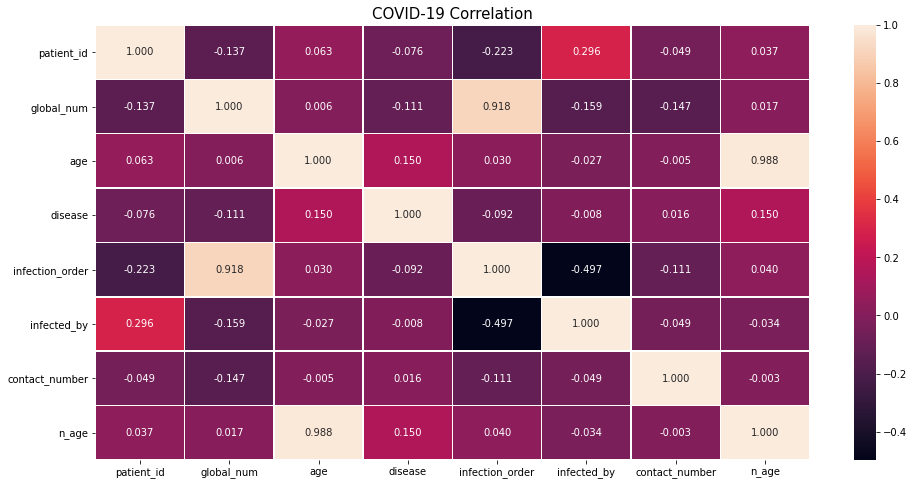

In [34]:
# Make a heatmap of the data 
plt.figure(figsize=(16,8)) # ensure that the Matplotlib plot is big enough
sns.heatmap(df.corr(), linewidths=.4, annot=True, fmt=".3f")
plt.title('COVID-19 Correlation', fontsize=15)

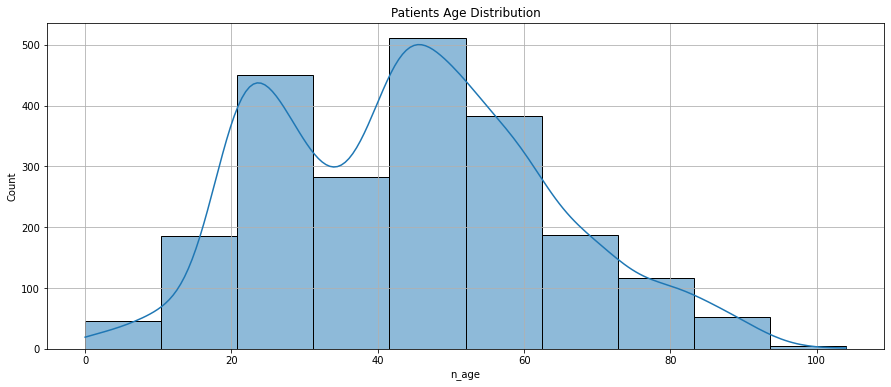

In [35]:
# Making a histogram of the n_age variable.
f, ax = plt.subplots(figsize = (15,6))
ax = sns.histplot(x=df['n_age'], kde=True, bins=10)
ax.set_title('Patients Age Distribution')
plt.grid(True)

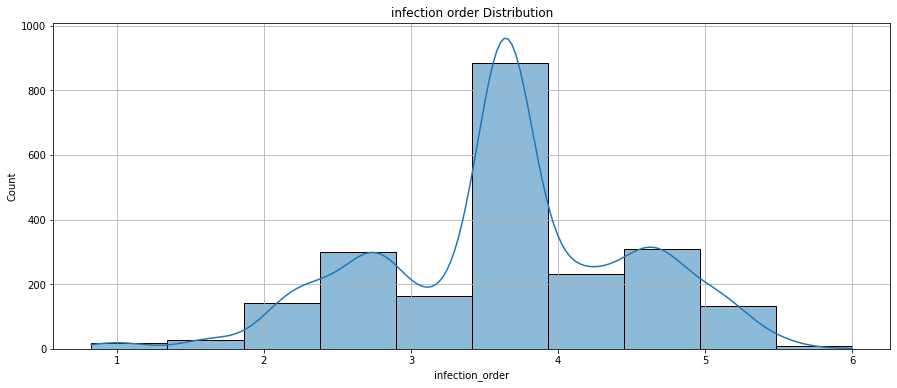

In [36]:
# Making a histogram of the infection_order variable.
f, ax = plt.subplots(figsize = (15,6))
ax = sns.histplot(x=df['infection_order'], kde=True, bins=10)
ax.set_title('infection order Distribution')
plt.grid(True)

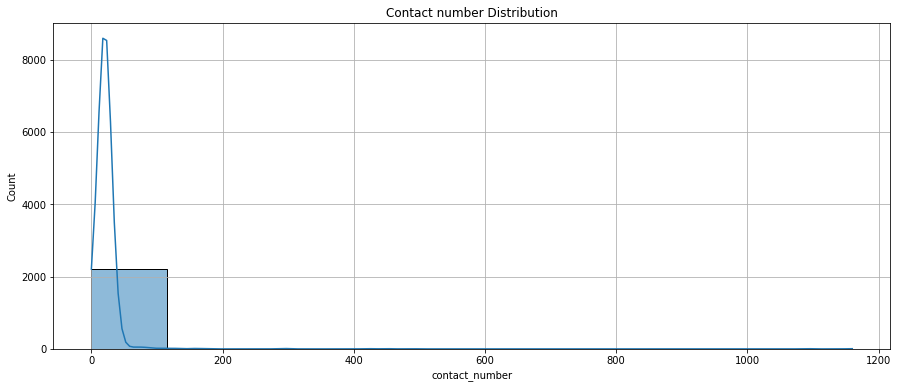

In [37]:
# Making a histogram of the contact_number variable.
f, ax = plt.subplots(figsize = (15,6))
ax = sns.histplot(x=df['contact_number'], kde=True, bins=10)
ax.set_title('Contact number Distribution')
plt.grid(True)

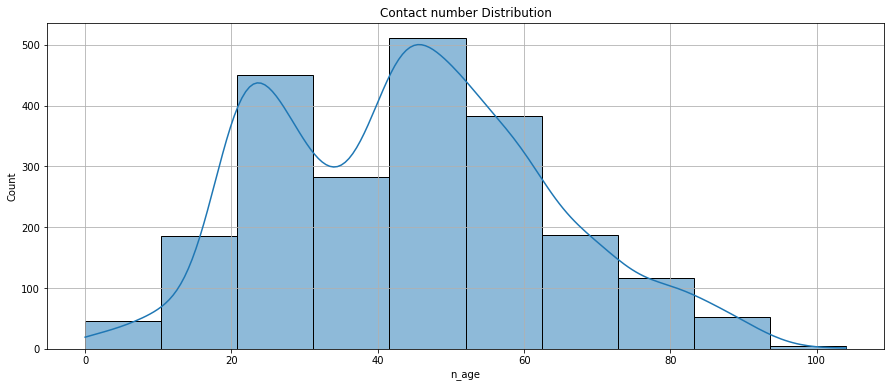

In [38]:
# Making a histogram of the contact_number variable.
f, ax = plt.subplots(figsize = (15,6))
ax = sns.histplot(x=df['n_age'], kde=True, bins=10)
ax.set_title('Contact number Distribution')
plt.grid(True)

In [39]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2218 entries, 0 to 2217
Data columns (total 14 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   patient_id       2218 non-null   int64  
 1   global_num       2218 non-null   float64
 2   sex              2073 non-null   object 
 3   age              1957 non-null   float64
 4   country          2218 non-null   object 
 5   province         2218 non-null   object 
 6   city             2153 non-null   object 
 7   disease          2218 non-null   int64  
 8   infection_case   1163 non-null   object 
 9   infection_order  2218 non-null   float64
 10  infected_by      2218 non-null   float64
 11  contact_number   2218 non-null   float64
 12  state            2130 non-null   object 
 13  n_age            2218 non-null   float64
dtypes: float64(6), int64(2), object(6)
memory usage: 242.7+ KB


### 5.6 Check for duplicated rows

In [40]:
duplicateRowsDF = df[df.duplicated()]
duplicateRowsDF

,patient_id,global_num,sex,age,country,province,city,disease,infection_case,infection_order,infected_by,contact_number,state,n_age


Review the count of unique values by column.

In [41]:
print(df.nunique())

patient_id         2218
global_num         1699
sex                   2
age                  11
country               4
province             17
city                134
disease               2
infection_case       16
infection_order    1671
infected_by        1346
contact_number     1381
state                 3
n_age               101
dtype: int64


Review the percent of unique values by column.

In [42]:
print(df.nunique()/df.shape[0])

patient_id         1.000000
global_num         0.766005
sex                0.000902
age                0.004959
country            0.001803
province           0.007665
city               0.060415
disease            0.000902
infection_case     0.007214
infection_order    0.753381
infected_by        0.606853
contact_number     0.622633
state              0.001353
n_age              0.045537
dtype: float64


Print the categorical columns and their associated levels.

In [43]:
# let's convert back 'age' from floar to str:
df['age'] = df['age'].astype('str')


In [44]:
dfo = df.select_dtypes(include=['object'], exclude=['datetime'])
dfo.shape
#get levels for all variables
vn = pd.DataFrame(dfo.nunique()).reset_index()
vn.columns = ['Var_Name', 'Levels_Count']
vn.sort_values(by='Levels_Count', ascending =False)
vn

,Var_Name,Levels_Count
0,sex,2
1,age,12
2,country,4
3,province,17
4,city,134
5,infection_case,16
6,state,3


Review the range of values per column.

In [45]:
pd.set_option('float_format', '{:.2f}'.format)
df.describe()

,patient_id,global_num,disease,infection_order,infected_by,contact_number,n_age
count,2218.00,2218.00,2218.00,2218.00,2218.00,2218.00,2218.00
mean,4014678094.55,4585.63,0.02,3.64,2600788987.64,22.00,44.20
std,2192418596.14,2230.94,0.12,0.85,721632772.67,39.51,18.77
min,1000000001.00,1.00,0.00,0.83,1000000002.00,0.00,0.00
25%,1700000007.25,3846.69,0.00,3.10,2600788987.01,14.84,28.00
50%,6001000034.50,4585.63,0.00,3.64,2600788987.64,22.00,44.20
75%,6004000027.75,5900.25,0.00,4.19,2600788987.86,22.14,57.00
max,7000000004.00,8717.00,1.00,6.00,6113000028.00,1160.00,104.00


### 5.7 Handle Categorical Missing Data Using KNN imputer "fancyimpute":

#### Now let's check which variables where there's NANs:

In [46]:
# Now let's confirm there's no NANs at: 'global_num','birth_year','infection_order','infected_by'and 'contact_number':
missing = pd.concat([df.isnull().sum(), 100 * df.isnull().mean()], axis=1)
missing.columns=['count', '%']
missing.sort_values(by='count', ascending=False)

,count,%
infection_case,1055,47.57
sex,145,6.54
state,88,3.97
city,65,2.93
patient_id,0,0.00
global_num,0,0.00
age,0,0.00
country,0,0.00
province,0,0.00
disease,0,0.00


In [47]:
#Let's cofirm data types at cat_var:
cat_var = ['infection_case', 'sex', 'state', 'city', 'age']
df[cat_var].dtypes

infection_case    object
sex               object
state             object
city              object
age               object
dtype: object

In [48]:
# Let's explore our categorical variables count so we can have an idea of the best way to handle the missing data:
print("infection_case count: ")
print(df['infection_case'].value_counts())
print('===============================================')
print("state count: ")
print(df['state'].value_counts())
print('===============================================')
print("sex count: ")
print(df['sex'].value_counts())
print('===============================================')
print("city count: ")
print(df['city'].value_counts())
print('===============================================')
print("age count: ")
print(df['age'].value_counts())

infection_case count: 
contact with patient                530
etc                                 220
Guro-gu Call Center                 102
Shincheonji Church                   86
overseas inflow                      61
Onchun Church                        33
gym facility in Cheonan              30
Ministry of Oceans and Fisheries     27
Cheongdo Daenam Hospital             21
Dongan Church                        17
Eunpyeong St. Mary's Hospital        14
Seongdong-gu APT                     13
gym facility in Sejong                4
Suyeong-gu Kindergarten               3
Pilgrimage to Israel                  1
River of Grace Community Church       1
Name: infection_case, dtype: int64
state count: 
isolated    1791
released     305
deceased      34
Name: state, dtype: int64
sex count: 
female    1171
male       902
Name: sex, dtype: int64
city count: 
Gyeongsan-si       535
Cheonan-si          98
Seongnam-si         89
Bonghwa-gun         60
Gumi-si             59
Chilgok-gun      

Alright, all remaining missing Data are Categorical data. Well, **the good thing we have many methods we can explore to use in order to handle the missing data in the categorical variables:**

1. Frequent Categorical Imputation: By replacing NAN values with the most frequent occurred category in variable/column, **unfortunately** this method won't be applicable in our case because as shown above we have very high count in one value compared to others in all the variables, so using this method will bias the prediction and distorts the relation of the most frequent label.
  
  
2. Create a New Category (Random Category): By Creating a new category for NAN values i.e random category. **Not a good option** since "infection_case" has almost 47% of the data is missing.


3. Adding a Variable To Capture NAN: By replacing NAN categories with most occurred values, and add a new feature to introduce some weight/importance to non-imputed and imputed observations. **again this is not a good option** because this method will create additional 4 columns and there will be a risk of **Curse of Dimensionality** and/or wrongly misunderstood the data.

  
4. KNN imputer **"fancyimpute"** for Categorical features: We are going to build a process that will handle all categorical variables in the dataset. The process will be outlined step by step as shown below:

**KNN imputer "fancyimpute" for Categorical features:**

**fancyimpute** is a wonderful way to apply an alternate imputation method to our data set. There are several methods that fancyimpute can perform ([documentation](https://pypi.org/project/fancyimpute/)) but we will utilize the **KNN imputer** specifically for categorical features.

First, we are going to load in our libraries. Since we are iterating through columns, we are going to ordinally encode our data in lieu of one-hot encoding. If you notice, the KNN package does require a tensorflow backend and uses tensorflow KNN processes. **The KNN method is a Multi-index method, meaning the data needs to all be handled then imputed.**

In [49]:
# Let's import the necessary packages:
from fancyimpute import KNN
from sklearn.preprocessing import OrdinalEncoder

In [50]:
# Let's confirm where's the missing data and what's the data types:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2218 entries, 0 to 2217
Data columns (total 14 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   patient_id       2218 non-null   int64  
 1   global_num       2218 non-null   float64
 2   sex              2073 non-null   object 
 3   age              2218 non-null   object 
 4   country          2218 non-null   object 
 5   province         2218 non-null   object 
 6   city             2153 non-null   object 
 7   disease          2218 non-null   int64  
 8   infection_case   1163 non-null   object 
 9   infection_order  2218 non-null   float64
 10  infected_by      2218 non-null   float64
 11  contact_number   2218 non-null   float64
 12  state            2130 non-null   object 
 13  n_age            2218 non-null   float64
dtypes: float64(5), int64(2), object(7)
memory usage: 242.7+ KB


Based on the information above, here is our situation:
 
 **1. Categorical data with text that needs encoded:** 'sex', 'country', 'province', 'city', 'state' and 'infection_case'.
 
 **2. Categorical data that has null values:** 'sex', 'city', 'state' and 'infection_case'.

We will identify the columns we will be encoding, the process to pull non-null data, encode it and return it to the dataset is below.

In [51]:
#instantiate both packages to use
encoder = OrdinalEncoder()
imputer = KNN()

# create a list of categorical columns to iterate over
cat_cols = ['sex','country','province','city','state', 'infection_case', 'age']

def encode(data):
    '''
    function to encode non-null data and 
    replace it in the original data
    '''
    
    #retains only non-null values
    nonulls = np.array(data.dropna())
    
    #reshapes the data for encoding
    impute_reshape = nonulls.reshape(-1,1)
    
    #encode date
    impute_ordinal = encoder.fit_transform(impute_reshape)
    
    #Assign back encoded values to non-null values
    data.loc[data.notnull()] = np.squeeze(impute_ordinal)
    return data

#create a for loop to iterate through each column in the data
for columns in cat_cols:
    encode(df[columns])

C:\Users\aktha\anaconda3\lib\site-packages\pandas\core\indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)
C:\Users\aktha\anaconda3\lib\site-packages\pandas\core\indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)
C:\Users\aktha\anaconda3\lib\site-packages\pandas\core\indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
 

In [52]:
# Let's check the data structure:
df

,patient_id,global_num,sex,age,country,province,city,disease,infection_case,infection_order,infected_by,contact_number,state,n_age
0,1000000001,2.00,1.00,6.00,1.00,15.00,34.00,0,15.00,1.00,2600788988.72,75.00,2.00,56.00
1,1000000002,5.00,1.00,4.00,1.00,15.00,76.00,0,15.00,1.00,2600788988.72,31.00,2.00,33.00
2,1000000003,6.00,1.00,6.00,1.00,15.00,74.00,0,11.00,2.00,2002000001.00,17.00,2.00,56.00
3,1000000004,7.00,1.00,3.00,1.00,15.00,77.00,0,15.00,1.00,2600788988.72,9.00,2.00,29.00
4,1000000005,9.00,0.00,3.00,1.00,15.00,99.00,0,11.00,2.00,1000000002.00,2.00,2.00,28.00
5,1000000006,10.00,0.00,6.00,1.00,15.00,74.00,0,11.00,3.00,1000000003.00,43.00,2.00,54.00
6,1000000007,11.00,1.00,3.00,1.00,15.00,74.00,0,11.00,3.00,1000000003.00,0.00,2.00,25.00
7,1000000008,13.00,1.00,3.00,1.00,15.00,132.00,0,15.00,1.00,2600788988.72,0.00,2.00,28.00
8,1000000009,19.00,1.00,4.00,1.00,15.00,106.00,0,15.00,2.00,2600788988.72,68.00,2.00,37.00
9,1000000010,21.00,0.00,7.00,1.00,15.00,99.00,0,11.00,3.00,1000000003.00,6.00,2.00,60.00


In [53]:
# impute data and convert 
encode_data = pd.DataFrame(np.round(imputer.fit_transform(df)),columns = df.columns)

Imputing row 1/2218 with 0 missing, elapsed time: 0.526
Imputing row 101/2218 with 0 missing, elapsed time: 0.527
Imputing row 201/2218 with 0 missing, elapsed time: 0.527
Imputing row 301/2218 with 0 missing, elapsed time: 0.528
Imputing row 401/2218 with 1 missing, elapsed time: 0.528
Imputing row 501/2218 with 0 missing, elapsed time: 0.530
Imputing row 601/2218 with 0 missing, elapsed time: 0.530
Imputing row 701/2218 with 0 missing, elapsed time: 0.530
Imputing row 801/2218 with 0 missing, elapsed time: 0.531
Imputing row 901/2218 with 0 missing, elapsed time: 0.532
Imputing row 1001/2218 with 0 missing, elapsed time: 0.533
Imputing row 1101/2218 with 1 missing, elapsed time: 0.534
Imputing row 1201/2218 with 1 missing, elapsed time: 0.535
Imputing row 1301/2218 with 1 missing, elapsed time: 0.537
Imputing row 1401/2218 with 1 missing, elapsed time: 0.539
Imputing row 1501/2218 with 1 missing, elapsed time: 0.541
Imputing row 1601/2218 with 1 missing, elapsed time: 0.543
Imputing 

In [54]:
# Alright, Now let's look at the new data after encoding and imputing:
encode_data

,patient_id,global_num,sex,age,country,province,city,disease,infection_case,infection_order,infected_by,contact_number,state,n_age
0,1000000001.00,2.00,1.00,6.00,1.00,15.00,34.00,0.00,15.00,1.00,2600788989.00,75.00,2.00,56.00
1,1000000002.00,5.00,1.00,4.00,1.00,15.00,76.00,0.00,15.00,1.00,2600788989.00,31.00,2.00,33.00
2,1000000003.00,6.00,1.00,6.00,1.00,15.00,74.00,0.00,11.00,2.00,2002000001.00,17.00,2.00,56.00
3,1000000004.00,7.00,1.00,3.00,1.00,15.00,77.00,0.00,15.00,1.00,2600788989.00,9.00,2.00,29.00
4,1000000005.00,9.00,0.00,3.00,1.00,15.00,99.00,0.00,11.00,2.00,1000000002.00,2.00,2.00,28.00
5,1000000006.00,10.00,0.00,6.00,1.00,15.00,74.00,0.00,11.00,3.00,1000000003.00,43.00,2.00,54.00
6,1000000007.00,11.00,1.00,3.00,1.00,15.00,74.00,0.00,11.00,3.00,1000000003.00,0.00,2.00,25.00
7,1000000008.00,13.00,1.00,3.00,1.00,15.00,132.00,0.00,15.00,1.00,2600788989.00,0.00,2.00,28.00
8,1000000009.00,19.00,1.00,4.00,1.00,15.00,106.00,0.00,15.00,2.00,2600788989.00,68.00,2.00,37.00
9,1000000010.00,21.00,0.00,7.00,1.00,15.00,99.00,0.00,11.00,3.00,1000000003.00,6.00,2.00,60.00


In [55]:
#let's confirm now there's no missing data any more:
missing = pd.concat([encode_data.isnull().sum(), 100 * encode_data.isnull().mean()], axis=1)
missing.columns=['count', '%']
missing.sort_values(by='count', ascending=False)

,count,%
patient_id,0,0.00
global_num,0,0.00
sex,0,0.00
age,0,0.00
country,0,0.00
province,0,0.00
city,0,0.00
disease,0,0.00
infection_case,0,0.00
infection_order,0,0.00


In [56]:
encode_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2218 entries, 0 to 2217
Data columns (total 14 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   patient_id       2218 non-null   float64
 1   global_num       2218 non-null   float64
 2   sex              2218 non-null   float64
 3   age              2218 non-null   float64
 4   country          2218 non-null   float64
 5   province         2218 non-null   float64
 6   city             2218 non-null   float64
 7   disease          2218 non-null   float64
 8   infection_case   2218 non-null   float64
 9   infection_order  2218 non-null   float64
 10  infected_by      2218 non-null   float64
 11  contact_number   2218 non-null   float64
 12  state            2218 non-null   float64
 13  n_age            2218 non-null   float64
dtypes: float64(14)
memory usage: 242.7 KB


In [57]:
encode_data.head()

,patient_id,global_num,sex,age,country,province,city,disease,infection_case,infection_order,infected_by,contact_number,state,n_age
0,1000000001.00,2.00,1.00,6.00,1.00,15.00,34.00,0.00,15.00,1.00,2600788989.00,75.00,2.00,56.00
1,1000000002.00,5.00,1.00,4.00,1.00,15.00,76.00,0.00,15.00,1.00,2600788989.00,31.00,2.00,33.00
2,1000000003.00,6.00,1.00,6.00,1.00,15.00,74.00,0.00,11.00,2.00,2002000001.00,17.00,2.00,56.00
3,1000000004.00,7.00,1.00,3.00,1.00,15.00,77.00,0.00,15.00,1.00,2600788989.00,9.00,2.00,29.00
4,1000000005.00,9.00,0.00,3.00,1.00,15.00,99.00,0.00,11.00,2.00,1000000002.00,2.00,2.00,28.00


In [58]:
# Now let's our final Dataframe after imputing NANs and encoding:
df = encode_data
df.head()

,patient_id,global_num,sex,age,country,province,city,disease,infection_case,infection_order,infected_by,contact_number,state,n_age
0,1000000001.00,2.00,1.00,6.00,1.00,15.00,34.00,0.00,15.00,1.00,2600788989.00,75.00,2.00,56.00
1,1000000002.00,5.00,1.00,4.00,1.00,15.00,76.00,0.00,15.00,1.00,2600788989.00,31.00,2.00,33.00
2,1000000003.00,6.00,1.00,6.00,1.00,15.00,74.00,0.00,11.00,2.00,2002000001.00,17.00,2.00,56.00
3,1000000004.00,7.00,1.00,3.00,1.00,15.00,77.00,0.00,15.00,1.00,2600788989.00,9.00,2.00,29.00
4,1000000005.00,9.00,0.00,3.00,1.00,15.00,99.00,0.00,11.00,2.00,1000000002.00,2.00,2.00,28.00


## 6. Random Forest Model

### 6.1 Split the data into test and train subsamples

In [59]:
df.columns.unique()

Index(['patient_id', 'global_num', 'sex', 'age', 'country', 'province', 'city',
       'disease', 'infection_case', 'infection_order', 'infected_by',
       'contact_number', 'state', 'n_age'],
      dtype='object')

In [60]:
from sklearn.model_selection import train_test_split

# Let's define our features:
features = ['global_num', 'sex', 'age', 'country', 'province', 'city',
       'disease', 'infection_case', 'infection_order', 'infected_by',
       'contact_number', 'n_age']

# dont forget to define your X and y
X = df[features]
y = df.state

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.2, random_state=1)

In [61]:
df['state'].value_counts()

1.00    1878
2.00     306
0.00      34
Name: state, dtype: int64

As shown above Dataset is imbalanced and that will affect the Model Accuracy

### 6.2 Scale data to prep for model creation

In [62]:
#scale data
from sklearn import preprocessing
import numpy as np
# build scaler based on training data and apply it to test data to then also scale the test data
scaler = preprocessing.StandardScaler().fit(X_train)
X_train_scaled=scaler.transform(X_train)
X_test_scaled=scaler.transform(X_test)

In [63]:
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import f1_score
from sklearn.metrics import auc
from sklearn.linear_model import LogisticRegression
from matplotlib import pyplot
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import f1_score
from sklearn.metrics import auc
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report,confusion_matrix,roc_curve,roc_auc_score
from sklearn.metrics import accuracy_score,log_loss
from matplotlib import pyplot

### 6.3 Fit Random Forest Classifier
The fit model shows an overall accuracy above 84.9%, however as shown below from ROC AUC, Classification report and the confusion reports the accuracy score is biased and not accurate mainly due to the fact we have imbalanced class "State", due to the nature of the dataset and the topic we're trying to tackle today which is COVID-19, as shown below




|code|state |count|
|:--:|:--: |:--:|
|1|isolated|    1878|
|2|released |    306|
|0|deceased |     34|

In [66]:
from sklearn.ensemble import RandomForestClassifier
clf = RandomForestClassifier(n_estimators=300, random_state = 1,n_jobs=-1)
model_res = clf.fit(X_train_scaled, y_train)
y_pred = model_res.predict(X_test_scaled)
y_pred_prob = model_res.predict_proba(X_test_scaled)
lr_probs = y_pred_prob[:,1]
ac = accuracy_score(y_test, y_pred)

f1 = f1_score(y_test, y_pred, average='weighted')
cm = confusion_matrix(y_test, y_pred)

print("Random Forest: Accuracy= {:.3f}".format(ac * 100), '%')

print("Random Forest: f1_score: {:.3f}".format(f1* 100), '%')

Random Forest: Accuracy= 85.360 %
Random Forest: f1_score: 82.903 %


### 6.4 Classification Report

In [67]:
print("Random Forest model : classification report")
print(classification_report(y_test, (model_res.predict(X_test_scaled)), digits=6))

Random Forest model : classification report
              precision    recall  f1-score   support

         0.0   1.000000  1.000000  1.000000         7
         1.0   0.871921  0.964578  0.915912       367
         2.0   0.580645  0.257143  0.356436        70

    accuracy                       0.853604       444
   macro avg   0.817522  0.740574  0.757449       444
weighted avg   0.828019  0.853604  0.829032       444



### 6.5 Create Confusion Matrix Plots
Confusion matrices are great ways to review your model performance for a multi-class classification problem specially when you have imbalanced dataset. Being able to identify which class the misclassified observations end up in is a great way to determine if you need to build additional features to improve your overall model. In the example below we plot a regular counts confusion matrix as well as a weighted percent confusion matrix. The percent confusion matrix is particulary helpful when you have unbalanced class sizes.

In [70]:
class_names=['isolated','released','deceased'] # name  of classes

Confusion matrix, without normalization
[[  7   0   0]
 [  0 354  13]
 [  0  52  18]]
Normalized confusion matrix
[[1.   0.   0.  ]
 [0.   0.96 0.04]
 [0.   0.74 0.26]]


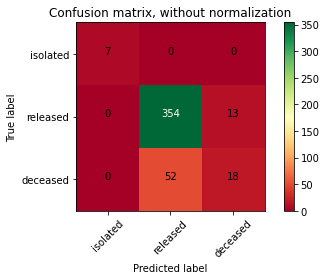

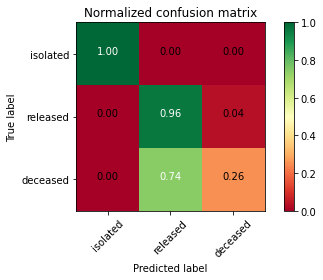

In [71]:
import itertools
import numpy as np
import matplotlib.pyplot as plt

from sklearn import svm, datasets
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix

def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    plt.imshow(cm, interpolation='nearest', cmap='RdYlGn')
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.tight_layout()


# Compute confusion matrix
cnf_matrix = confusion_matrix(y_test, y_pred)
np.set_printoptions(precision=2)

# Plot non-normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=class_names,
                      title='Confusion matrix, without normalization')
#plt.savefig('figures/RF_cm_multi_class.png')

# Plot normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=class_names, normalize=True,
                      title='Normalized confusion matrix')
#plt.savefig('figures/RF_cm_proportion_multi_class.png', bbox_inches="tight")
plt.show()

## 7. Plot features importance
The random forest algorithm can be used as a regression or classification model. In either case it tends to be a bit of a black box, where understanding what's happening under the hood can be difficult. Plotting the feature importances is one way that you can gain a perspective on which features are driving the model predictions.

12


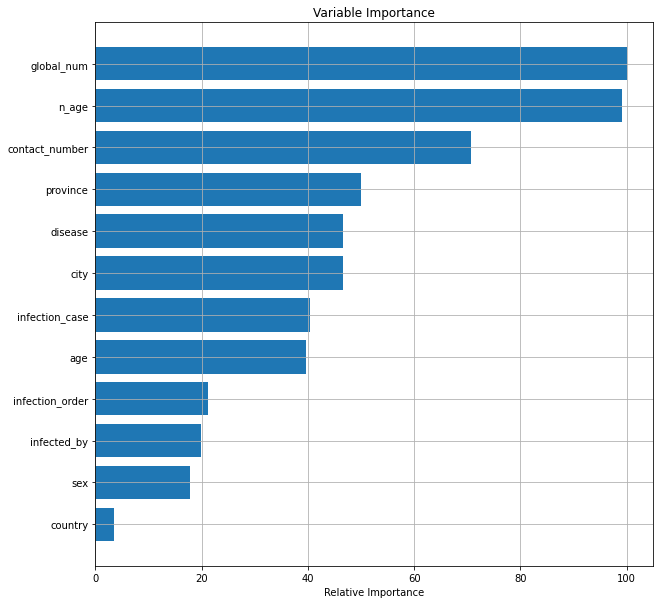

In [72]:
feature_importance = clf.feature_importances_
# make importances relative to max importance
feature_importance = 100.0 * (feature_importance / feature_importance.max())[:30]
sorted_idx = np.argsort(feature_importance)[:30]

pos = np.arange(sorted_idx.shape[0]) + .5
print(pos.size)
sorted_idx.size
plt.figure(figsize=(10,10))
plt.barh(pos, feature_importance[sorted_idx], align='center')
plt.yticks(pos, X.columns[sorted_idx])
plt.xlabel('Relative Importance')
plt.title('Variable Importance')
plt.grid(True)
plt.show()

## 8. Hyperparameter Tuning using GridSearchCV

In [73]:
from pprint import pprint
# Look at parameters used by our current forest

print('Parameters currently in use:\n')
pprint(model_res.get_params())


Parameters currently in use:

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': None,
 'max_features': 'auto',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_impurity_split': None,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 300,
 'n_jobs': -1,
 'oob_score': False,
 'random_state': 1,
 'verbose': 0,
 'warm_start': False}


The default values for the above parameters controlling the size of the trees (e.g. max_depth, min_samples_leaf, etc.) lead to fully grown and unpruned trees which can potentially be very large on some data sets. To reduce memory consumption, the complexity and size of the trees should be controlled by setting those parameter values.

The features are always randomly permuted at each split. Therefore, the best found split may vary, even with the same training data, max_features=n_features and bootstrap=False, if the improvement of the criterion is identical for several splits enumerated during the search of the best split. To obtain a deterministic behaviour during fitting, random_state has to be fixed.

Please check [documentation on the random forest in Scikit-Learn](https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestClassifier.html) & [user guide](https://scikit-learn.org/stable/modules/ensemble.html#forest) to have more understanding of these parameters.



### 8.1 Visualize one Decision Tree from our Base Model

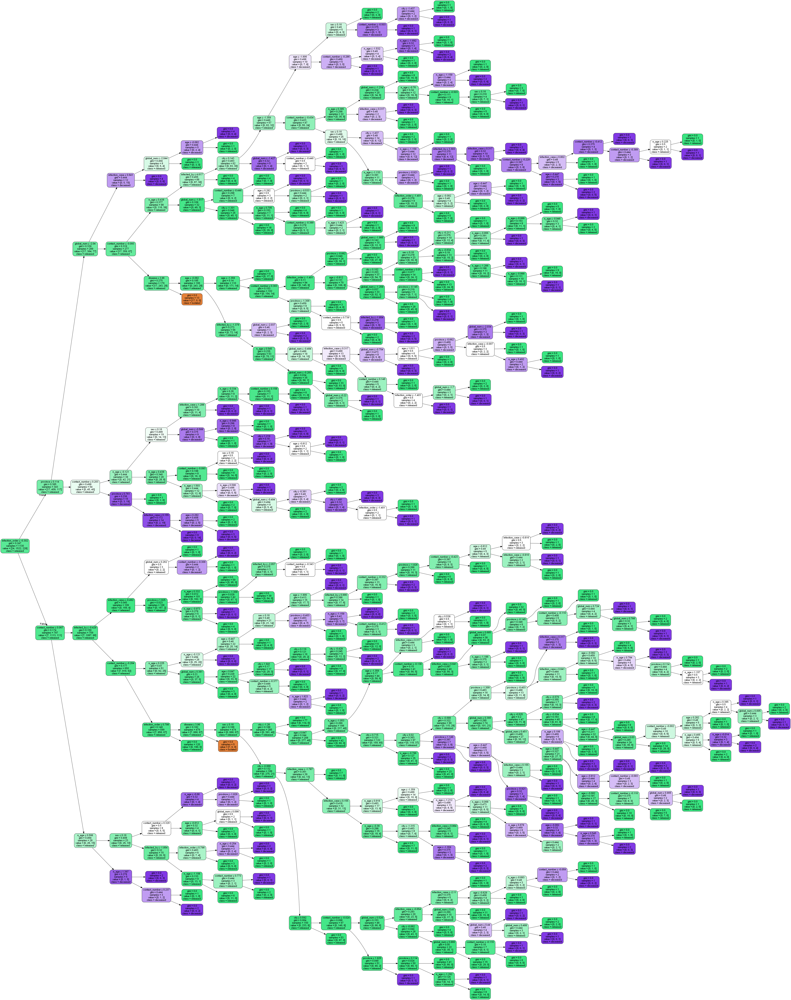

In [74]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import export_graphviz
from subprocess import call
from io import StringIO 
import pydotplus
from IPython.display import Image  

# Extract single tree
estimator = model_res.estimators_[2]

# Now we want to visualize the tree
dot_data = StringIO()

# We can do so with export_graphviz
export_graphviz(estimator, out_file=dot_data, 
                     filled=True, rounded=True, rotate =True,
                     special_characters=True, feature_names=X_train.columns,class_names = ['isolated','released','deceased']) 

# Alternatively for class_names use entr_model.classes_
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

### 8.2 Compare Random Forests (Base vs Tuned)

In [75]:
from sklearn.model_selection import GridSearchCV
# Create the parameter grid based on the results of random search 
param_grid = {
    'bootstrap': [True],
    'max_depth': [80, 90, 100, 110],
    'max_features': [2, 3],
    'min_samples_leaf': [3, 4, 5],
    'min_samples_split': [8, 10, 12],
    'n_estimators': [100, 200, 300, 1000]
}

In [76]:
# Create a based model
clf = RandomForestClassifier()

# Instantiate the grid search model
grid_search = GridSearchCV(estimator = clf, param_grid = param_grid, 
                          cv = 10, n_jobs = -1, verbose = 2)

X_train_scaled

# Fit the grid search to the data
grid_search.fit(X_train_scaled, y_train)
grid_search.best_params_

Fitting 10 folds for each of 288 candidates, totalling 2880 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:    4.0s
[Parallel(n_jobs=-1)]: Done 146 tasks      | elapsed:   27.4s
[Parallel(n_jobs=-1)]: Done 349 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 632 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 997 tasks      | elapsed:  3.9min
[Parallel(n_jobs=-1)]: Done 1442 tasks      | elapsed:  6.2min
[Parallel(n_jobs=-1)]: Done 1969 tasks      | elapsed:  9.0min
[Parallel(n_jobs=-1)]: Done 2576 tasks      | elapsed: 12.3min
[Parallel(n_jobs=-1)]: Done 2880 out of 2880 | elapsed: 14.2min finished


{'bootstrap': True,
 'max_depth': 110,
 'max_features': 3,
 'min_samples_leaf': 4,
 'min_samples_split': 8,
 'n_estimators': 100}

In [83]:
from sklearn.ensemble import RandomForestClassifier
clf = RandomForestClassifier(n_estimators=300, random_state = 1,n_jobs=-1)
model_res = clf.fit(X_train_scaled, y_train)
y_pred = model_res.predict(X_test_scaled)
y_pred_prob = model_res.predict_proba(X_test_scaled)
lr_probs = y_pred_prob[:,1]
ac = accuracy_score(y_test, y_pred)

f1 = f1_score(y_test, y_pred, average='weighted')
cm = confusion_matrix(y_test, y_pred)

print("Random Forest (Base): Accuracy= {:.3f}".format(ac * 100), '%')
print("==========================================")
print("Random Forest (Base): f1_score: {:.3f}".format(f1 * 100), '%')


Random Forest (Base): Accuracy= 85.360 %
Random Forest (Base): f1_score: 82.903 %


In [82]:
from sklearn.ensemble import RandomForestClassifier
clf_tuned = RandomForestClassifier(random_state = 1,n_jobs=-1,
                            bootstrap=True, max_depth=110, max_features=3,
                            min_samples_leaf=4, min_samples_split=8, n_estimators=100)
model_tun = clf_tuned.fit(X_train_scaled, y_train)
y_pred_tun = model_tun.predict(X_test_scaled)
y_pred_prob_tun = model_tun.predict_proba(X_test_scaled)
lr_probs_tun = y_pred_prob_tun[:,1]
ac_tun = accuracy_score(y_test, y_pred_tun)

f1_tun = f1_score(y_test, y_pred_tun, average='weighted')
cm_tun = confusion_matrix(y_test, y_pred_tun)

print("Random Forest (Tuned): Accuracy= {:.3f}".format(ac_tun * 100), '%')
print("==========================================")
print("Random Forest (Tuned): f1_score: {:.3f}".format(f1_tun * 100), '%')

Random Forest (Tuned): Accuracy= 86.712 %
Random Forest (Tuned): f1_score: 83.112 %


| Random Froests (Base) | Random Forests (Tuned)|
|:---------------------:|:---------------------:|
|Accuracy= 0.849|Accuracy= 0.869|
|f1_score: 0.824|f1_score: 0.835|







### 8.3 Visualize same Decision Tree from our Tuned Model

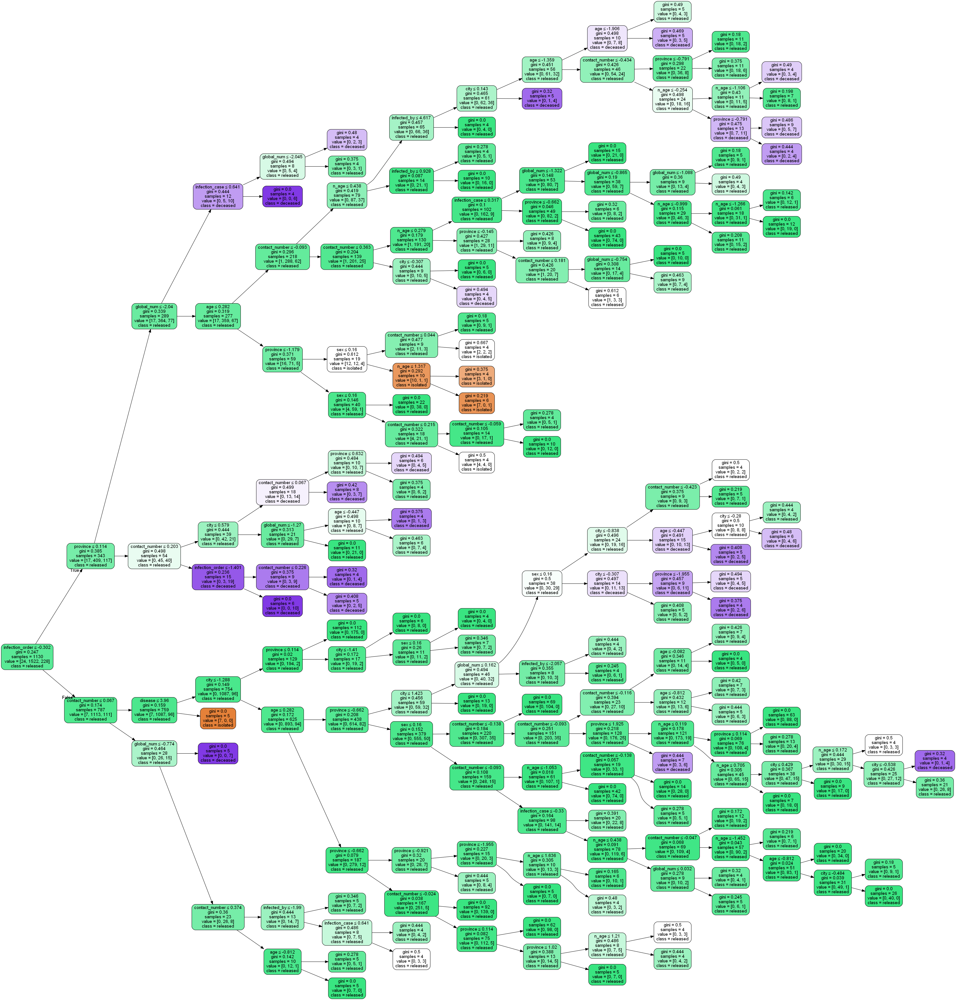

In [81]:
# Extract single tree
estimator = model_tun.estimators_[2]

# Now we want to visualize the tree
dot_data = StringIO()

# We can do so with export_graphviz
export_graphviz(estimator, out_file=dot_data, 
                     filled=True, rounded=True, rotate =True,
                     special_characters=True, feature_names=X_train.columns,class_names = ['isolated','released','deceased']) 

# Alternatively for class_names use entr_model.classes_
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

## 9. Conclusion

 * The Random Forests (Base) Model shows an overall accuracy of 85.36%, which is great and indicates that our model was effectively able to identify the status of the COVID-19 patients in the South Korea dataset despite the fact that we have imbalanced class **"State"**, due to the nature of the dataset and the topic we're trying to tackle today which is **Predicting COVID-19 Patients State** , as shown below:

|code|state |count|
|:--:|:--: |:--:|
|1|isolated|    1878|
|2|released |    306|
|0|deceased |     34|

 * As shown above, There's huge difference between the decision Tree we visualized using the Base Model compared to the Tuned Model. The Base Model lead to a fully grown and unpruned DT which looks very large. so after we fined tuned the Random Forest Parameters we managed to improve Accuracy by 1.3% from 85.36% to 86.7% and there was a clear reduction in the Decision Trees size thus reducing memory consumption, the complexity and we find the split choices that will get us to the pure nodes much faster resulting in more information gain (more prediction power)
 * The popularity of random forest is primarily due to how well it performs in a multitude of data situations. It tends to handle highly correlated features well, where as a linear regression model would not. In this project we demonstrate the performance ability even with only a few features and almost all of them being highly correlated with each other.
Random Forest is also used as an efficient way to investigate the importance of a set of features with a large data set. Consider random forest to be one of your first choices when building a decision tree, especially for multiclass classifications.

In [1]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))